#### Write a function using this reference and use alternating least squares instead of gradient descent to repeat Part 1, 2 of Q5, using your written function. [2 Marks]

Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import PIL
from copy import deepcopy

from sklearn import preprocessing
# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

import os

# Retina display
%config InlineBackend.figure_format = 'retina'

Helper Functions

In [2]:
def metrics(img1, img2, max_value = 1.0):
    rmse = np.linalg.norm(img1.reshape(-1,1)-img2.reshape(-1,1), ord=2)/(img1.shape[0]*img1.shape[1])**0.5
    psnr_value = 20 * np.log10(max_value / rmse)
    return rmse, psnr_value

In [3]:
def lossInMaskedImages(X, U, V, mask):
    error = 0
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            if mask[i,j]:
                error += (X[i,j] - np.dot(U[i,:],V[:,j]))**2
    return np.sqrt(error)

In [4]:
def alternatingLeastSquares(X,k=2,epochs=1000,convergence=1e-6, mask = False):
  """
  Implements Alternative Least Squares Algorithm for Matrix Factorization X = UV
  Inputs:
  X: Ground Truth Matrix of size (Nxd)
  k: Rank
  epochs: Number of epochs t=for convergence
  convergence: Threshold value of change of losses in consecutive epochs. 
  mask: Whether a mask needs to be applied on the image (for the case of incomplete matrix)

  Outputs:
  U: Matrix of size (Nxk)
  V: Matrix of size (kxd)
  """

  N,d = X.shape
  U = np.random.uniform(size=(N,k))
  V = np.random.uniform(size=(k,d))
  if mask == False:
    delta_loss = np.linalg.norm(X-U@V,'fro')
    losses = [delta_loss]
    while delta_loss > convergence:

      for col in range(d):
        V[:,col] = np.linalg.lstsq(U,X[:,col],rcond=None)[0]

      for row in range(N):
        U[row,:] = np.linalg.lstsq(V.T,X[row,:],rcond=None)[0]

      losses.append(np.linalg.norm(X-U@V, 'fro'))
      if abs(losses[-1] - losses[-2]) < convergence:
        break
  else:
    mask = ~np.isnan(X) # True for all relevant values
    delta_loss = lossInMaskedImages(X,U,V,mask)
    losses = [delta_loss]
    while delta_loss > convergence:

      for col in range(d):
        x = X[mask[:,col],col]
        u = U[mask[:,col],:]
        V[:,col] = np.linalg.lstsq(u,x,rcond=None)[0]

      for row in range(N):
        x = X[row,mask[row,:]]
        v = V.T[mask[row,:],:]
        U[row,:] = np.linalg.lstsq(v,x,rcond=None)[0]

      losses.append(lossInMaskedImages(X,U,V,mask))
      if abs(losses[-1] - losses[-2]) < convergence:
        break

  return U,V,losses

In [5]:
def reconstructImageUsingALS(X, k = 5):
  """
  Reconstructs an input image using Alternating Least Squares Method of Matrix Factorization
  Inputs:
  X: Image of dimensions as (Height, Width, Channels)
  k: Rank (for Matrix Factorization)

  Output:
  Image plot comparing the original image with the reconstructed one.
  """
  np.random.seed(42)
  h, w, c = X.shape
  img = np.random.uniform((h,w,c))
  if sum(np.isnan(X)) == 0:
    mask = False
  else:
    mask = True
  for i in range(c):
    U,V,losses = alternatingLeastSquares(X[:,:,i], k, convergence=1e-6,mask=mask)
    img[:,:,i] = U@V

  rmse, psnr = metrics(X,img)
  fig,ax = plt.subplots(1,2, figsize=(10,6))
  plt.suptitle(f'Reconstruction using ALS based Matrix Factorization, Rank : {k}\n RMSE: {rmse}, PSNR: {psnr}dB')
  fig.subplots_adjust(top = 0.9)
  ax[0].imshow(X)
  ax[0].set_title('Original')
  ax[1].imshow(img)
  ax[1].set_title('Reconstructed')
  plt.show()

In [6]:
def mask_image(img, corner, d, verbose, display = True, patch = True):
    if patch == True:
        X, Y = corner
        img_copy = deepcopy(img)
        img_copy[X : X + d, Y : Y + d, :] = float("nan")
        crop = deepcopy(img[X:X+d, Y:Y+d,:])
        fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [img.shape[1] / (5 * d), 1]})
        fig.suptitle(f"{verbose} with corner at $({X}, {Y})$ and patch size = $({d} \times {d})$", fontsize = 16)
        ax[0].imshow(img_copy)
        ax[0].set_title("Masked Image")
        ax[1].imshow(crop)
        ax[1].set_title("Masked Crop")
    else:
        img_copy = deepcopy(img)
        img_copy[np.random.uniform(img.shape[0],img.shape[1]) < 0.5] = float('nan')


    if (display):
        plt.show()
    else:
        plt.close()
    return img_copy, crop

In [7]:
def train_reconstruct_plot(img, corner, d, k, convergence, allowMetrics = False, patch = True):
    if patch  == True:
        imgSingle, croppedSingle = mask_image(img, corner, d, "Single Colored Patch", display = False, patch = True)

        h, w, c = imgSingle.shape
        img_reconstructed = np.zeros((h,w,c))
        np.random.seed(42)
        for i in range(c):
            U,V,losses = alternatingLeastSquares(imgSingle[:,:,i], k, convergence=convergence,mask = True)
            img_reconstructed[:,:,i] = U@V
        
        X, Y = corner
        newCroppedSingle = img_reconstructed[X : X + d, Y : Y + d,:]
        rmse, psnr = metrics(img, img_reconstructed)
        fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [img.shape[1] / (3 * d), 1, img.shape[1] / (3 * d)]}, figsize = (15, 8))
        fig.suptitle(f"RMSE : {rmse} | PSNR : {psnr}" "\n" fr"Crop corner = $({X}, {Y})$" "\n" f"Rank = {k}" "\n" f"Converged after {len(losses)} iteration", fontsize = 12)
        ax[0].imshow(imgSingle)
        ax[0].set_title("Masked Image" "\n" rf"$({img.shape[0]} \times {img.shape[1]})$")
        ax[1].imshow(croppedSingle)
        ax[1].set_title("Patch" "\n" fr"$({d} \times {d})$")
        ax[2].imshow(img_reconstructed)
        ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[0]} \times {img.shape[1]})$")
        for i in range(3):
            ax[i].axis("off")
        plt.show()

        fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 4))
        fig.suptitle("Comparison of Original and Reconstructed Patch", fontsize = 12)                                                  
        ax[0].imshow(croppedSingle)
        ax[0].set_title("Original Patch")
        ax[0].axis("off")
        ax[1].imshow(newCroppedSingle)
        ax[1].set_title("Reconstructed Patch")
        ax[1].axis("off")
        plt.show()
    else:
        imgSingle, croppedSingle = mask_image(img, corner, d, "Single Colored Patch", display = False, patch = False)
        h, w, c = imgSingle.shape
        img_reconstructed = np.zeros((h,w,c))
        np.random.seed(42)
        for i in range(c):
            U,V,losses = alternatingLeastSquares(imgSingle[:,:,i], k, convergence=convergence,mask = True)
            img_reconstructed[:,:,i] = U@V
        
        X, Y = corner
        newCroppedSingle = img_reconstructed[X : X + d, Y : Y + d,:]
        rmse, psnr = metrics(img, img_reconstructed)
        fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [img.shape[1] / (3 * d), 1, img.shape[1] / (3 * d)]}, figsize = (15, 8))
        fig.suptitle(f"RMSE : {rmse} | PSNR : {psnr}" "\n" fr"Crop corner = $({X}, {Y})$" "\n" f"Rank = {k}" "\n" f"Converged after {len(losses)} iteration", fontsize = 12)
        ax[0].imshow(imgSingle)
        ax[0].set_title("Masked Image" "\n" rf"$({img.shape[0]} \times {img.shape[1]})$")
        ax[1].imshow(croppedSingle)
        ax[1].set_title("Patch" "\n" fr"$({d} \times {d})$")
        ax[2].imshow(img_reconstructed)
        ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[0]} \times {img.shape[1]})$")
        for i in range(3):
            ax[i].axis("off")
        plt.show()

        fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 4))
        fig.suptitle("Comparison of Original and Reconstructed Patch", fontsize = 12)                                                  
        ax[0].imshow(croppedSingle)
        ax[0].set_title("Original Patch")
        ax[0].axis("off")
        ax[1].imshow(newCroppedSingle)
        ax[1].set_title("Reconstructed Patch")
        ax[1].axis("off")
        plt.show()

    
    if (allowMetrics):
        return rmse, psnr

Get the image

In [8]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [9]:
# Read in a image from torchvision
img = PIL.Image.open('dog.jpg')
img = np.asarray(img)
print(img.shape)

(1365, 2048, 3)


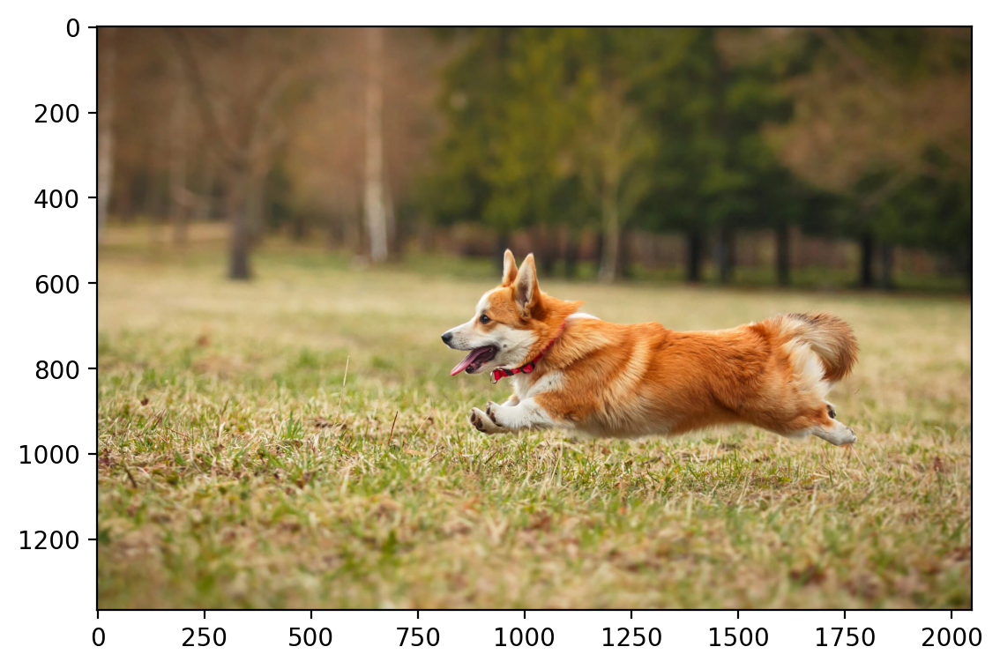

In [10]:
plt.imshow(img)
plt.show()

Processing the image

In [11]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape, img_scaled

((1365, 2048, 3),
 array([[[0.30980392, 0.20392157, 0.1372549 ],
         [0.31372549, 0.20784314, 0.14117647],
         [0.31372549, 0.20784314, 0.14117647],
         ...,
         [0.29411765, 0.21568627, 0.11764706],
         [0.29411765, 0.21568627, 0.11764706],
         [0.29803922, 0.21176471, 0.11764706]],
 
        [[0.30980392, 0.20392157, 0.1372549 ],
         [0.31372549, 0.20784314, 0.14117647],
         [0.31372549, 0.20784314, 0.14117647],
         ...,
         [0.29411765, 0.21568627, 0.11764706],
         [0.29411765, 0.21568627, 0.11764706],
         [0.29803922, 0.21176471, 0.11764706]],
 
        [[0.30980392, 0.20392157, 0.1372549 ],
         [0.31372549, 0.20784314, 0.14117647],
         [0.31372549, 0.20784314, 0.14117647],
         ...,
         [0.29411765, 0.21568627, 0.11764706],
         [0.29411765, 0.21568627, 0.11764706],
         [0.29803922, 0.21176471, 0.11764706]],
 
        ...,
 
        [[0.4745098 , 0.40392157, 0.14509804],
         [0.4745098 , 0

(300, 300, 3)


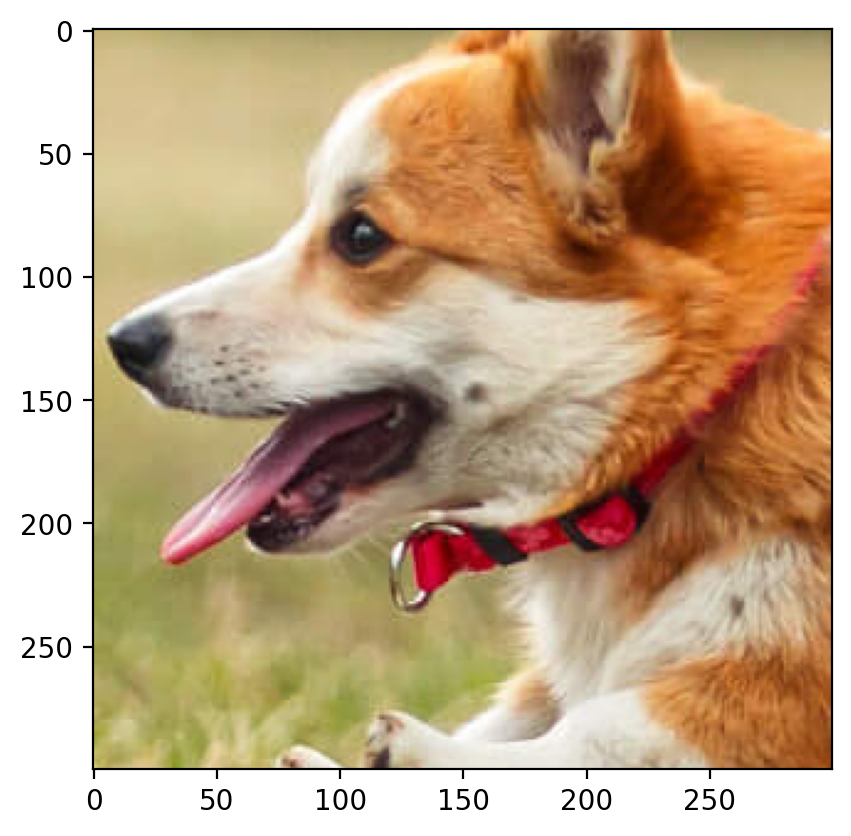

In [12]:
x0, y0, n = 600, 800, 300
crop = img_scaled[x0:x0+n,y0:y0+n,:]
print(crop.shape)
plt.imshow(crop)
plt.show()

Ordinary Reconstruction

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


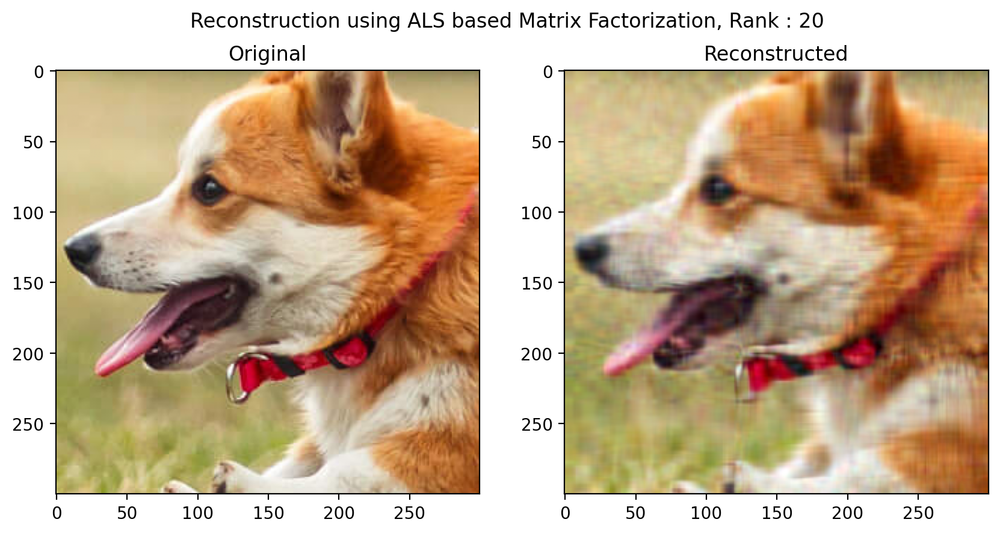

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


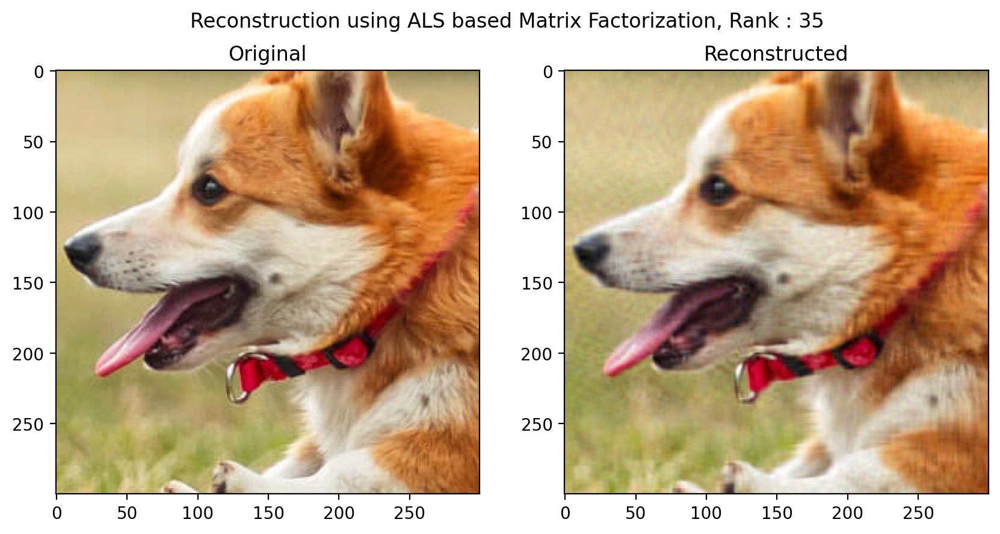

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


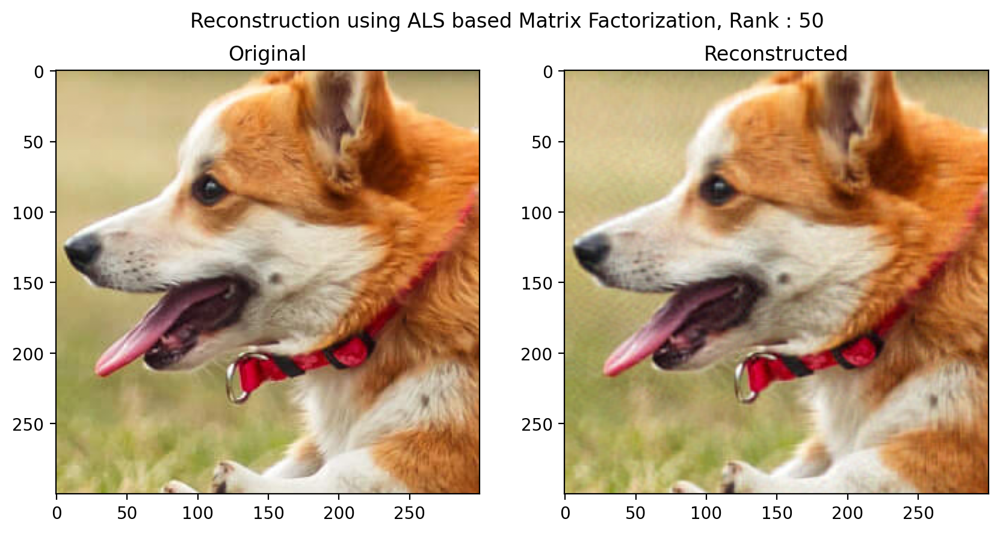

In [41]:
for k in [20, 35, 50]:
  reconstructImageUsingALS(crop, k)

30 x 30 Rectangular Patch of Image Removed

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


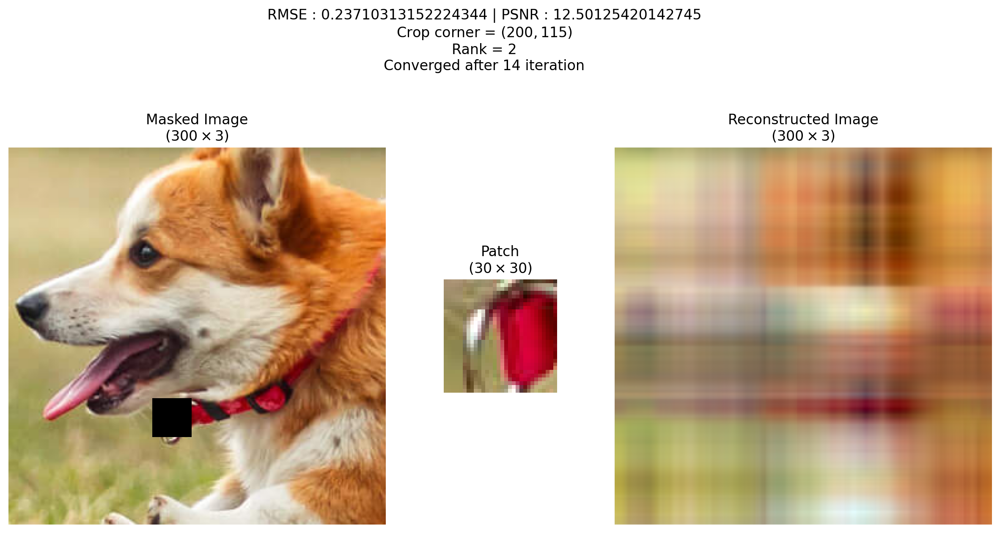

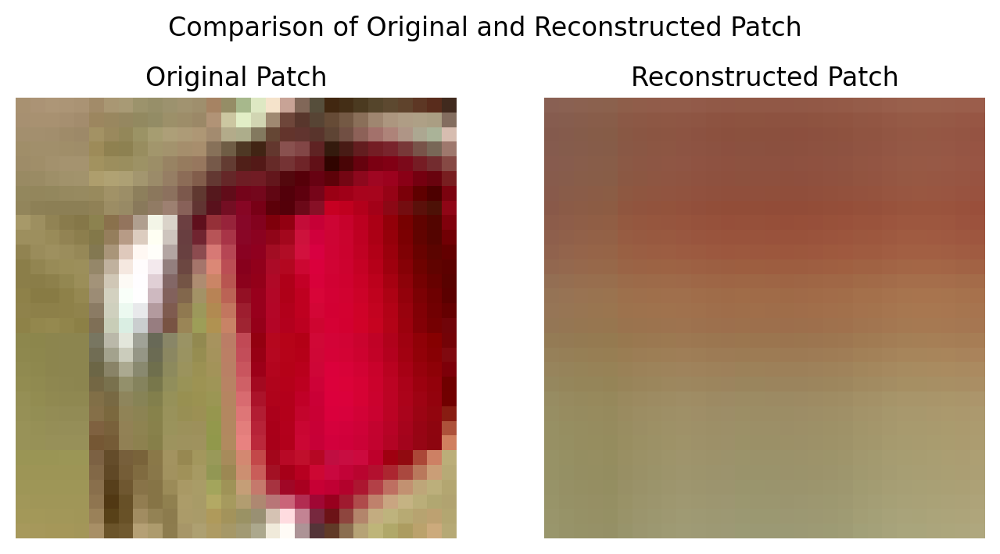

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


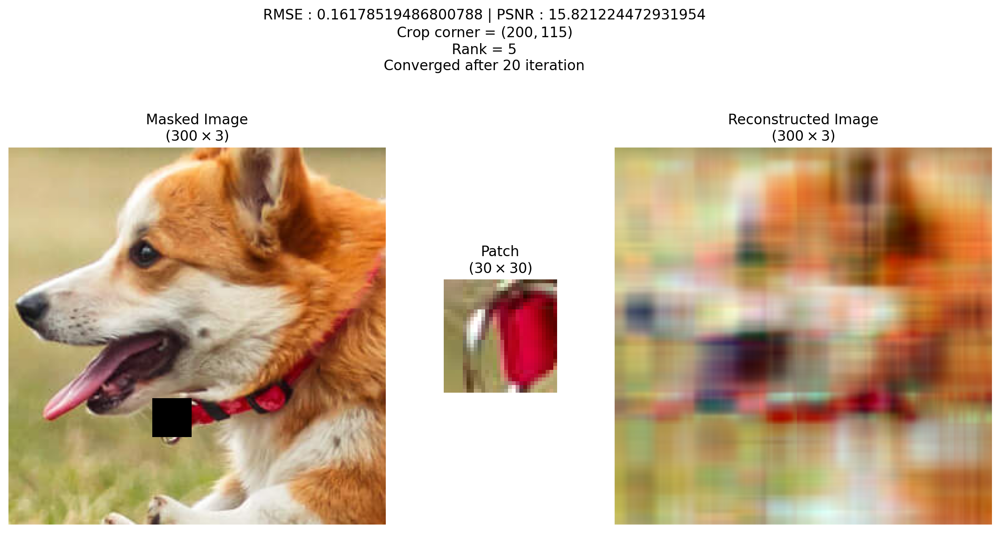

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


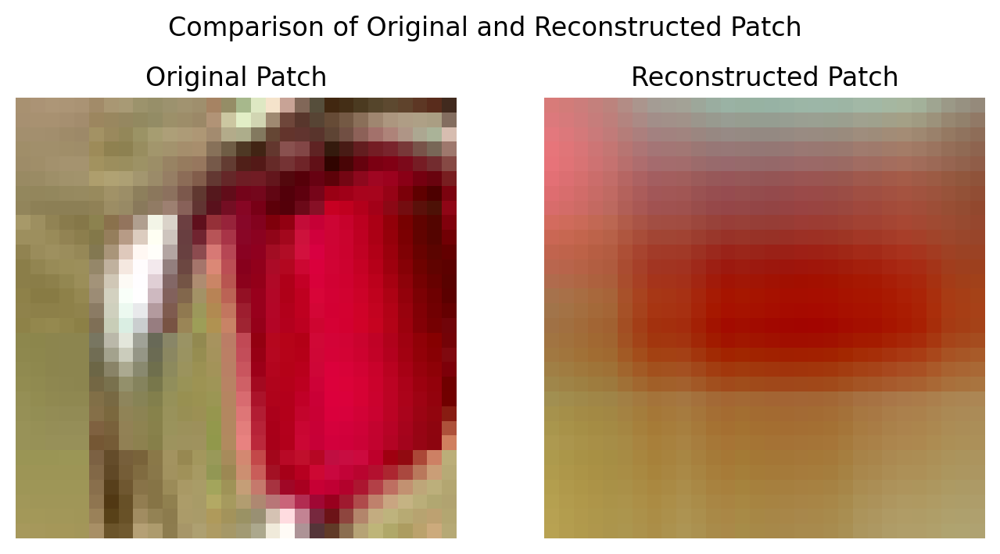

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


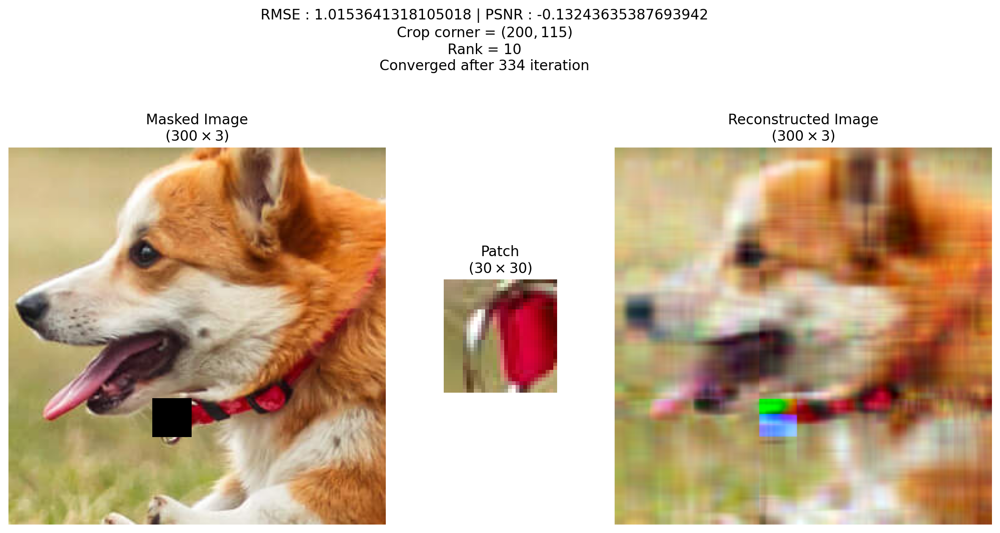

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


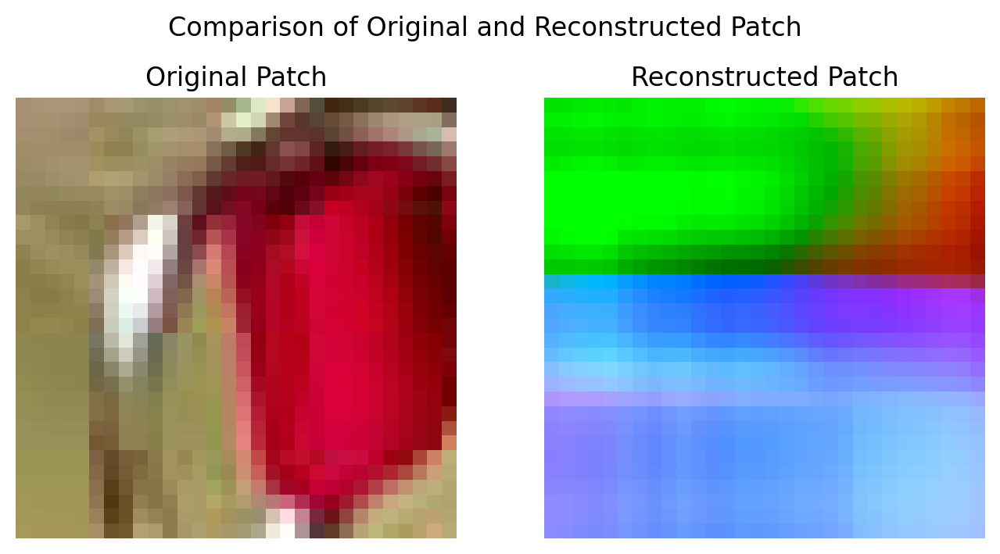

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


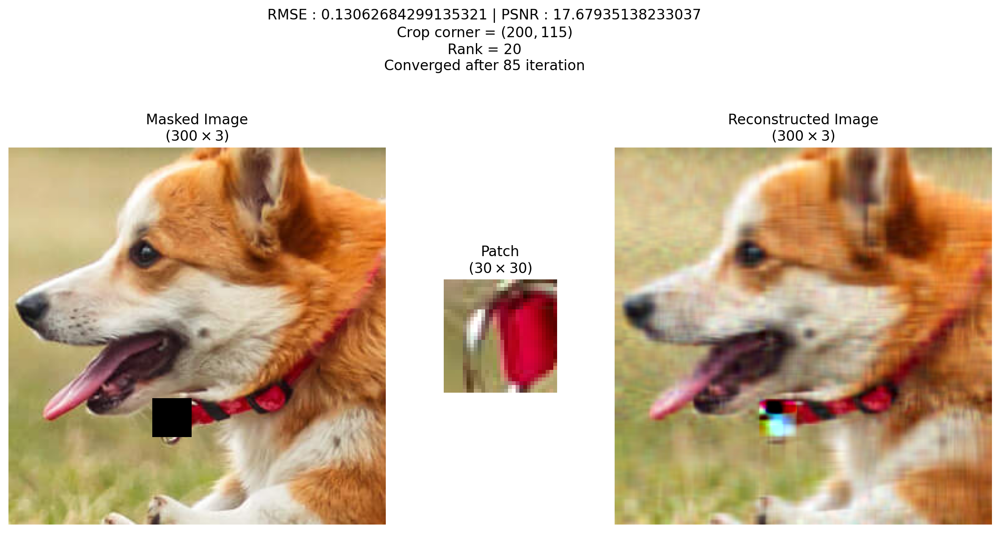

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


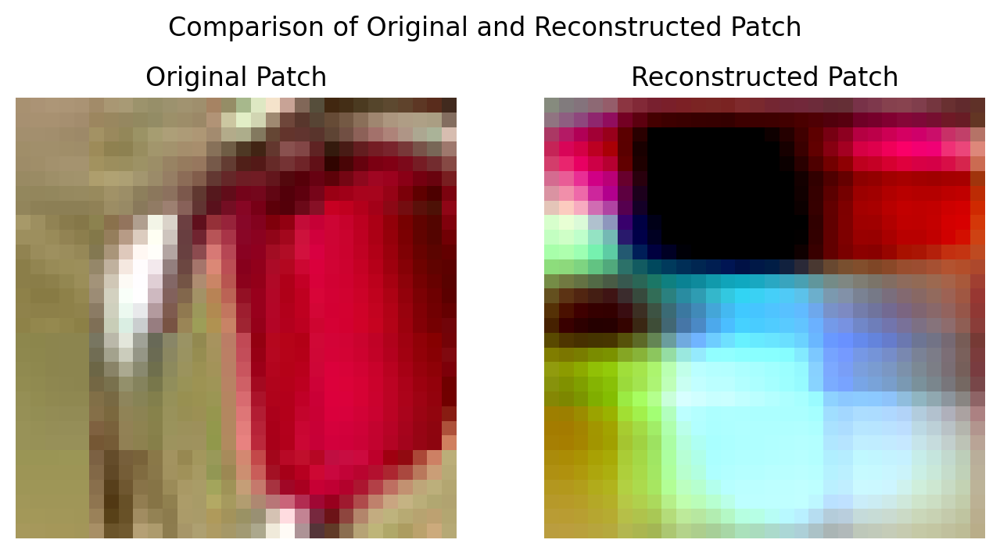

KeyboardInterrupt: 

In [13]:
for k in [2, 5, 10, 20, 50]:
    train_reconstruct_plot(crop, corner = (200,115), d=30, k=k, convergence = 10e-6, FileName = None, allowMetrics = False)

Random Subset of 900 (30x30) Pixels Removed

In [ ]:
for k in [2, 5, 10, 20, 50]:
    train_reconstruct_plot(crop, corner = (200,115), d=30, k=k, convergence = 10e-6, FileName = None, allowMetrics = False)